
🔹 Top 5 expensive cars:


,model,price,odometer,condition
0,nissan frontier,375000,115000.0,good
1,ram 2500,300000,-1.0,excellent
2,ford f-150,189000,151248.0,good
3,ford f-150,189000,151248.0,good
4,ford f-150,189000,151248.0,good


,Model,Count
0,ford f-150,3
1,nissan frontier,1
2,ram 2500,1


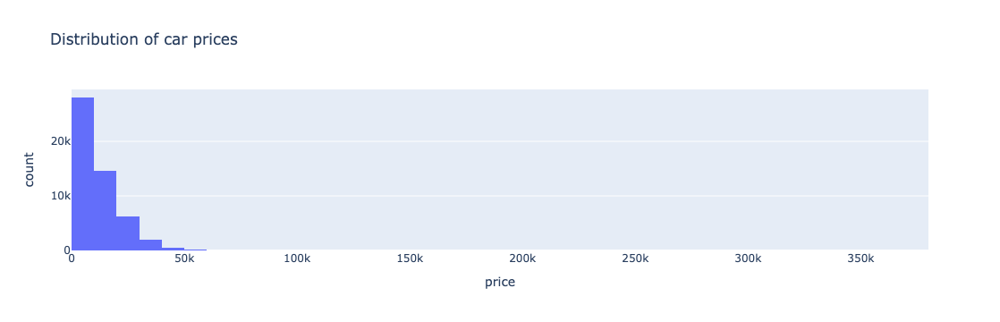

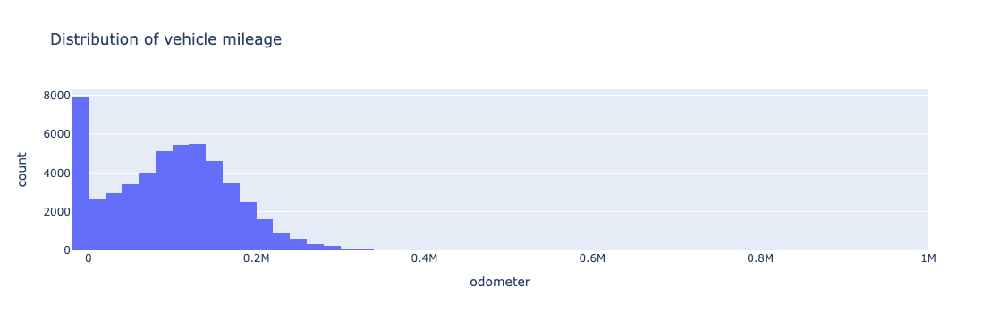

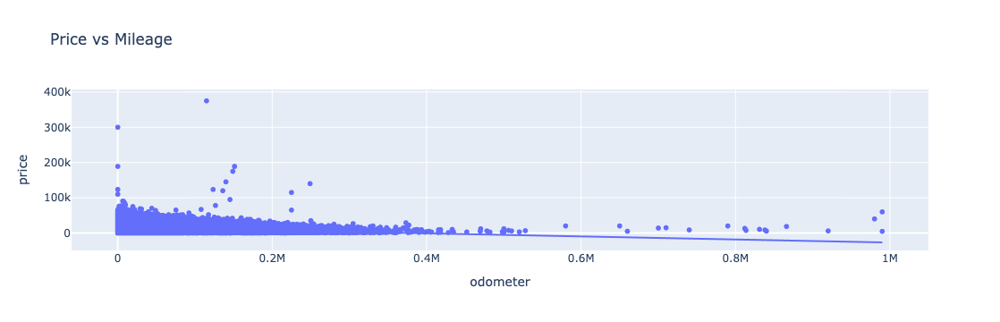

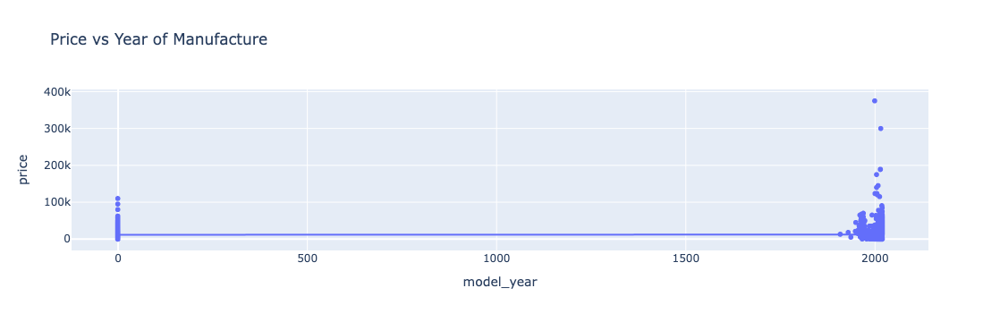

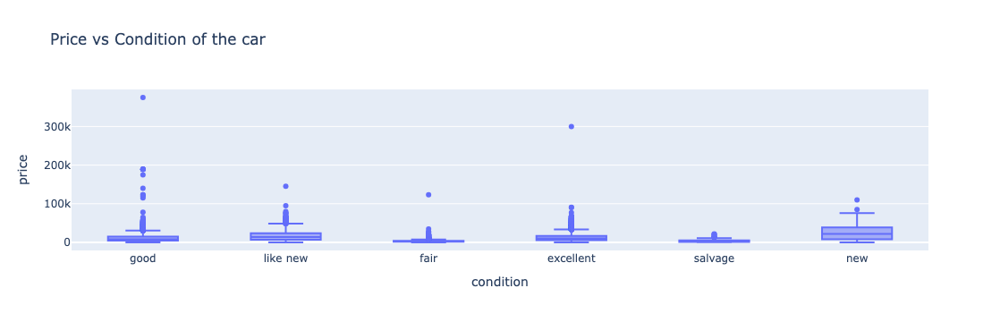


Key observations:
- There are outliers in the price data (0 and extremely high values).
- Mileage distribution is logical, but there are some anomalies.
- Price depends on the year of manufacture and the car's condition.


In [51]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv('//Users/misabutarin/Documents/GitHub/Python_project/vehicles_us.csv')

# Replace NaN in text columns with "Unknown"
df.replace({col: {pd.NA: "Unknown"} for col in df.select_dtypes(include=['object']).columns}, inplace=True)

# Replace NaN in numerical columns with -1
num_cols = ['price', 'odometer', 'model_year']
df[num_cols] = df[num_cols].fillna(-1)

# Top 5 expensive cars
top_expensive_cars = df.nlargest(5, 'price') 
print("\n🔹 Top 5 expensive cars:")
display(top_expensive_cars[['model', 'price', 'odometer', 'condition']].reset_index(drop=True))


# Count of expensive cars
expensive_cars_df = expensive_cars_count.reset_index()
expensive_cars_df.columns = ['Model', 'Count']  
display(expensive_cars_df)


# Remove duplicates (if any)
df.drop_duplicates(inplace=True)


# Histogram of car prices
fig = px.histogram(df, x='price', nbins=50, title='Distribution of car prices')
fig.show()

# Histogram of mileage
fig = px.histogram(df, x='odometer', nbins=50, title='Distribution of vehicle mileage')
fig.show()

# Scatter plot: price vs mileage
fig = px.scatter(df, x='odometer', y='price', title='Price vs Mileage', trendline='ols')
fig.show()

# Scatter plot: price vs model year
fig = px.scatter(df, x='model_year', y='price', title='Price vs Year of Manufacture', trendline='ols')
fig.show()

# Box plot: price vs condition
fig = px.box(df, x='condition', y='price', title='Price vs Condition of the car')
fig.show()

# Conclusions
print("\nKey observations:")
print("- There are outliers in the price data (0 and extremely high values).")
print("- Mileage distribution is logical, but there are some anomalies.")
print("- Price depends on the year of manufacture and the car's condition.")
